# 2024 San Pedro de Atacama Mw 7.4 (us7000n05d) — moment tensor + finite fault at 127 km depth

**Event:** 2024-07-19 01:50:48.57 UTC, 23.0791°S 67.8404°W, hypocentre 127 km — the largest
intermediate-depth earthquake in the Calama–San Pedro cluster since 1950, ~80 km ESE of the
2026 Calama M6.9 analysed in nb24. Intraslab normal faulting inside the subducted Nazca slab.

**Why this event matters to us: a live nodal-plane dispute.**
- The **USGS operational finite-fault model** puts the slip on the **shallow plane (172/21)**.
- **Jia et al. (2025, Nat. Comms.)**, using 54 teleseismic + 47 strong-motion stations + GNSS
  and aftershock relocations, argue for the **steep plane (341/71)**: five subevents at
  120–180 km depth, episodically supershear (~4.2 km/s), interpreted as thermal runaway.

nb24 showed that for the compact 2026 M6.9, teleseismic data **cannot** distinguish the planes
(misfits 0.1402 vs 0.1424, a 1.6% near-tie). The question here: with a rupture ~4× larger in
linear dimension, do teleseismic body waves alone become decisive — and which side do they take?

**Answer (this notebook): yes, and they side with Jia.** Under a comparison that is fair by
construction (identical 62 body channels, no drops, no surface waves possible on either plane),
the steep plane fits 10% better (0.1099 vs 0.1224) and its slip distribution independently
reproduces Jia's 120–180 km depth extent.

In [1]:
import os, json
import numpy as np, pandas as pd
from IPython.display import Image, display
import sys
sys.path.insert(0, os.path.expanduser('~/works/17.Venezuela_2026/scripts'))
B = os.path.expanduser('~/works/17.Venezuela_2026')
R = os.path.join(B, 'results')
E = os.path.join(B, 'event_2024_spda/20240719015048/ffm.0')

## Setting: same cluster as the 2026 event
The event sits in the 100–130+ km intermediate-depth Calama–San Pedro cluster (see nb24's
regional-context section: 1916/1950/1962/2005/2020/2024/2026 M6.8+ events). The 2024 M7.4 is
the modern instrumental benchmark for the cluster — and the only member with a published
near-field-constrained rupture model (Jia et al.), which makes it the natural validation
target for our teleseismic-only pipeline.

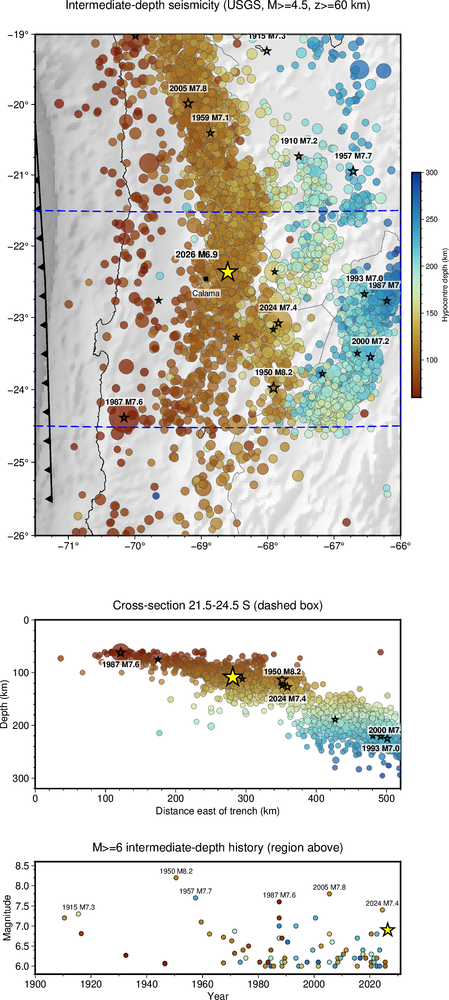

In [2]:
display(Image(os.path.join(B,'event_2026_calama/report/fig_regional_seismicity.png')))

## A. MTUQ moment tensor
Deep-event protocol from nb23/nb24, scaled for the larger event: the source duration is ~20 s,
so the long-period body band moves to **35–80 s** (`--bwband 35,80,150,12`: 150-s window
holding the P+pP+sP group, ±12 s shifts). Two independent runs:

| run | data | Mw | mechanism (s/d/r) |
|---|---|---|---|
| SW-only (`--nobody`) | 26 stations, surface waves 60–120 s | 7.40 | 176/20/−70 |
| LP-body joint | body 35–80 s + surface waves | 7.40 | 176/20/−70 |

**Both protocols give the same answer first-try** — the validation that the nb24 cure
("the cure is frequency") transfers to a different, larger event with no re-tuning.
- 6.3° (Kagan) from the USGS Mww (168/25/−70).
- The conjugate plane is **334.8/71.3/−97 — 7.8° from Jia's steep plane (341/71)**.
- 30.9° from our 2026 Calama mechanism (194/16/−83): same normal-faulting family, different
  orientation — mechanism diversity inside one cluster.

In [3]:
for tag in ('mtuq_dc_2024spda/2024spda', 'mtuq_dc_spda_lpbody/spda_lpbody'):
    sol = json.load(open(os.path.join(R, tag + '_solution.json')))
    print(f"{tag.split('/')[0]:24s} Mw {sol['Mw']:.2f} | {sol['kappa']:.1f}/{np.degrees(np.arccos(sol['h'])):.1f}/{sol['sigma']:.1f} | depth {sol['depth_in_m']/1e3:.0f} km")

mtuq_dc_2024spda         Mw 7.40 | 175.5/20.4/-69.8 | depth 127 km
mtuq_dc_spda_lpbody      Mw 7.40 | 175.5/20.4/-69.8 | depth 127 km


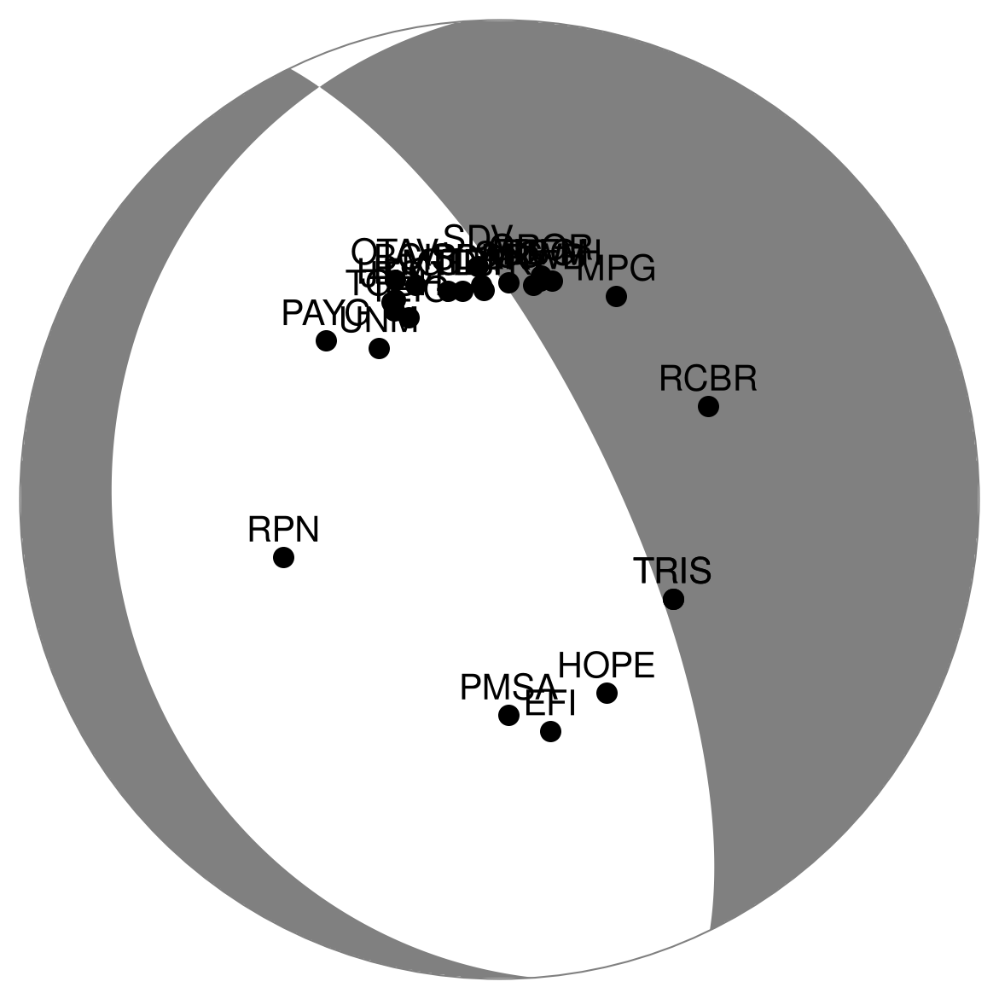

In [4]:
display(Image(os.path.join(R,'mtuq_dc_2024spda/2024spda_beachball.png')))

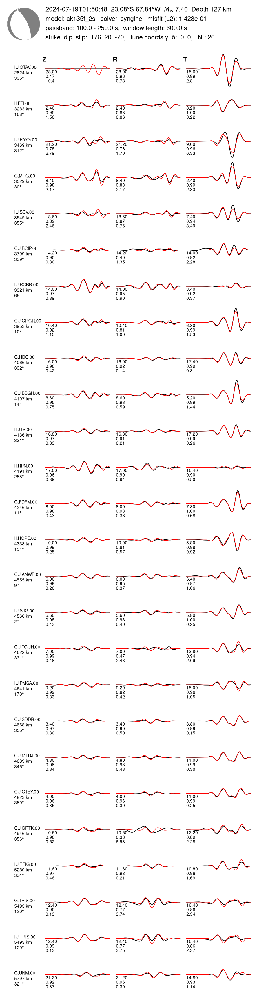

In [5]:
display(Image(os.path.join(R,'mtuq_dc_spda_lpbody/spda_lpbody_waveforms_sw.png')))

## B. WISP finite-fault inversion — the plane test
`ffm model run . auto_model -t body -t surf` on both nodal planes of our MT.

**The surface-wave GF cap makes this comparison fair by construction.** WISP's surface-wave
Green's-function bank ends at 125 km. With the hypocentre at 127.3 km, **every** fault plane
through the hypocentre exceeds the cap — so surface waves are dropped identically on BOTH
planes (unlike the 2026 case, where an asymmetric silent drop faked a discrimination and had
to be repaired). What remains is a clean controlled experiment:

- identical data: **62 teleseismic body channels** (39 P + 23 SH), zero stations dropped,
  all weights equal across planes;
- identical fault discretisation (15×15 subfaults, 8.2×6.8 km), annealing settings, and
  velocity model;
- the only difference is the plane orientation.

| plane | misfit (auto) | misfit (independent re-anneal) | peak slip | slip depth (>15% peak) | slip centroid |
|---|---|---|---|---|---|
| shallow 172/21 (USGS FFM choice) | 0.1224 | 0.1224 | 0.90 m | 109–144 km | 129.9 km |
| **steep 341/69 (Jia choice)** | **0.1099** | **0.1099** | 1.11 m | 81–170 km | 138.4 km |

**The steep plane fits 10.2% better** — far outside the 1.6% near-tie of the 2026 event and
reproduced exactly by an independent re-anneal on both planes. Teleseismic body waves alone
discriminate the disputed planes of this event, and they agree with Jia's near-field-based
verdict against the USGS operational choice.

In [6]:
import re
for p in ('NP1_ref', 'NP2_ref'):
    t = open(os.path.join(E, p, 'modelling_summary.txt')).read()
    m = float(re.search(r'averaged misfit error\s+([\d.]+)', t).group(1))
    print(f"{p}: averaged misfit {m:.4f}")

NP1_ref: averaged misfit 0.1224
NP2_ref: averaged misfit 0.1099


### B1. Slip models (both planes shown with equal completeness)
The steep plane nucleates at 127 km and ruptures **down-dip** to ~170 km — independently
reproducing the depth extent of Jia's five subevents (120–180 km) that we never told the
inversion about. The shallow plane, geometrically unable to reach those depths (21° dip),
concentrates slip at 109–144 km.

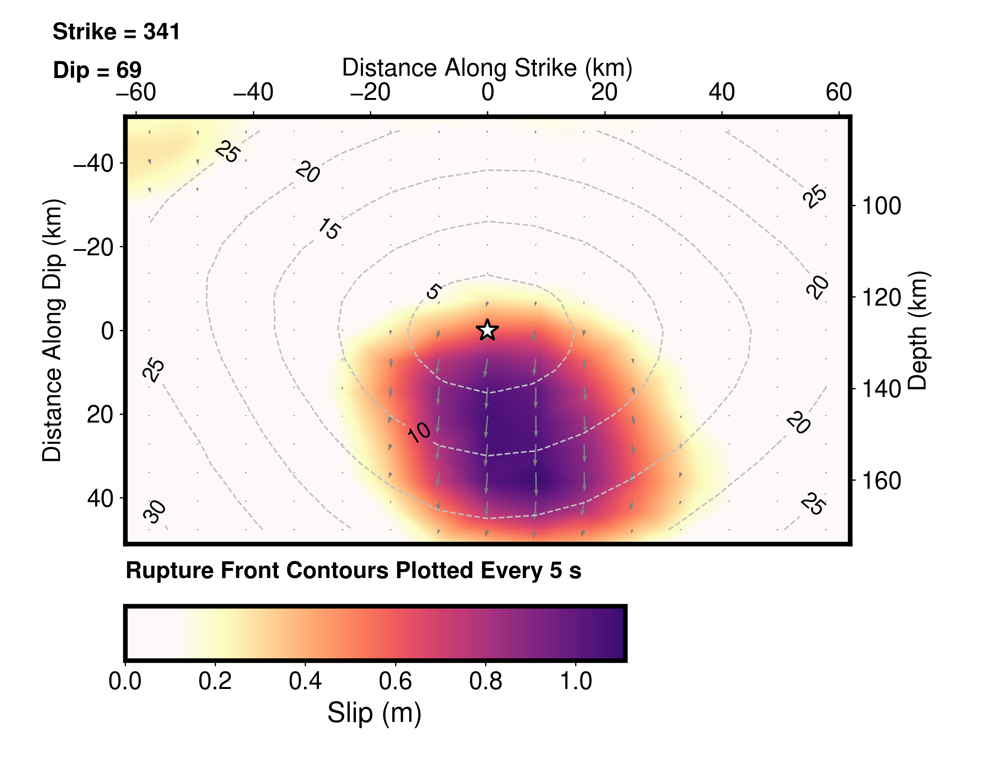

In [7]:
display(Image(os.path.join(E,'NP2_ref/plots/SlipDist_plane0_5s.png')))

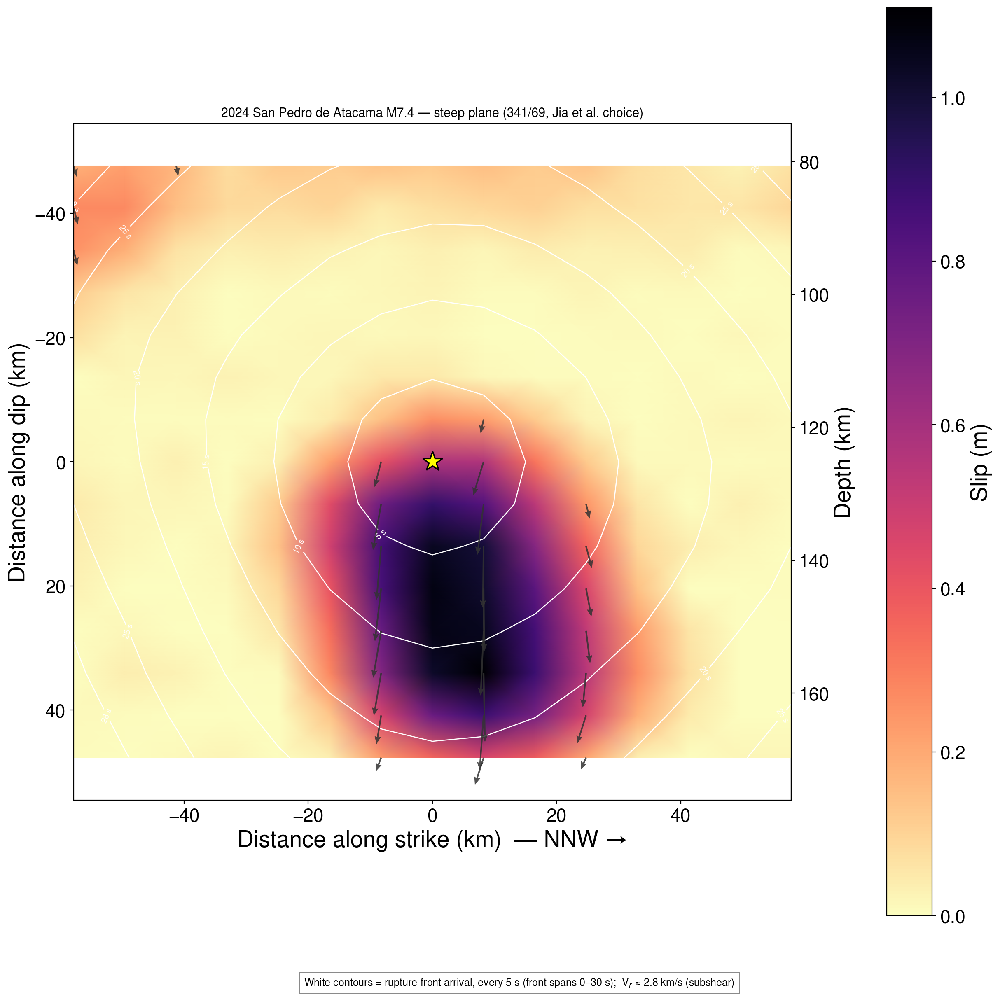

In [8]:
display(Image(os.path.join(E,'NP2_ref/plots/SlipIsochrone_trueScale.png')))

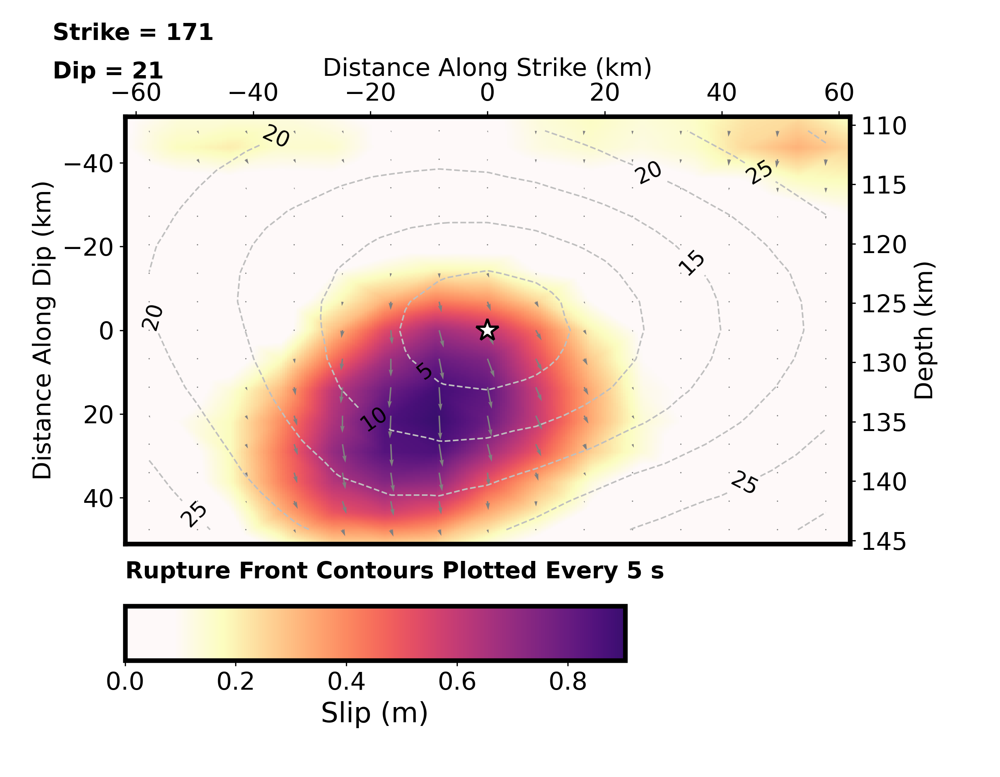

In [9]:
display(Image(os.path.join(E,'NP1_ref/plots/SlipDist_plane0_5s.png')))

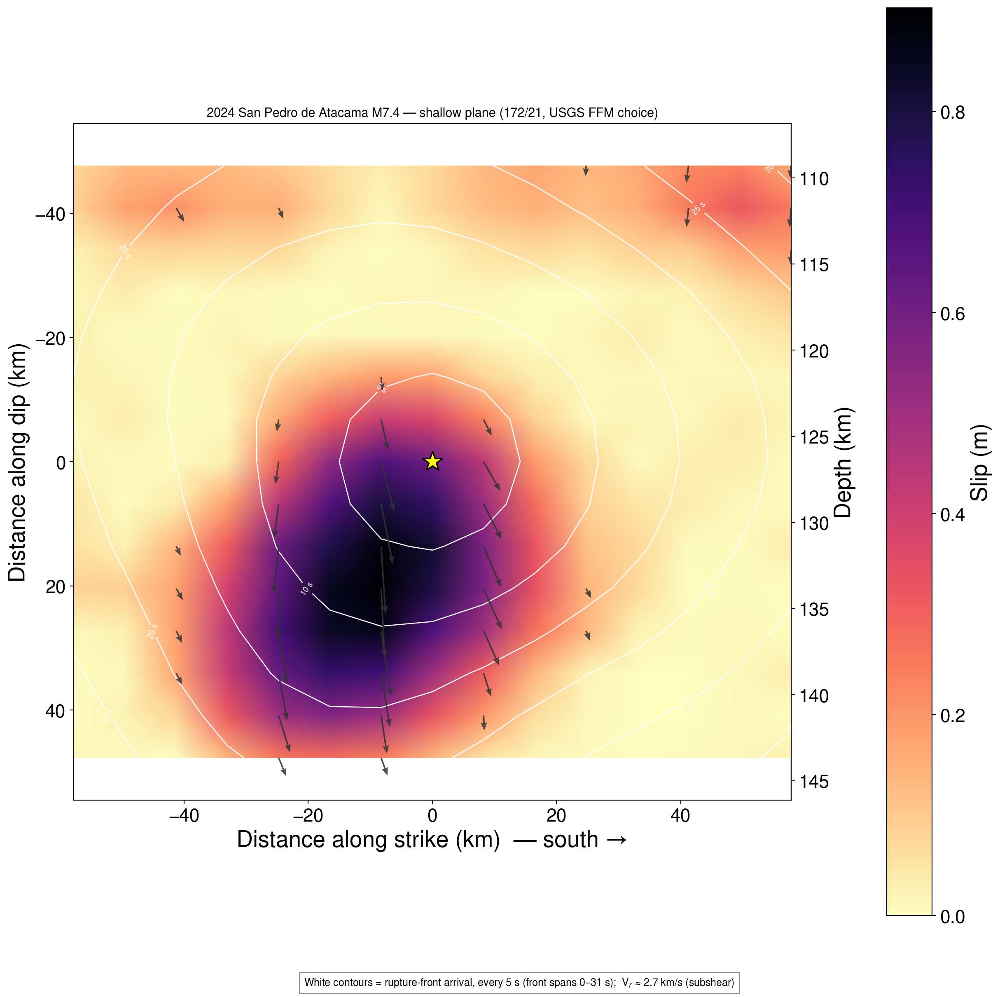

In [10]:
display(Image(os.path.join(E,'NP1_ref/plots/SlipIsochrone_trueScale.png')))

### B2. Moment rate
Both planes recover a **complex, multi-pulse moment-rate function** (main pulses ~10 s and
~18 s, minor episode ~35 s; total ~40 s) — consistent with the complexity in the USGS MRF and
with Jia's episodic five-subevent rupture. Model moment 1.42e20 N·m (Mw 7.37) on both planes.

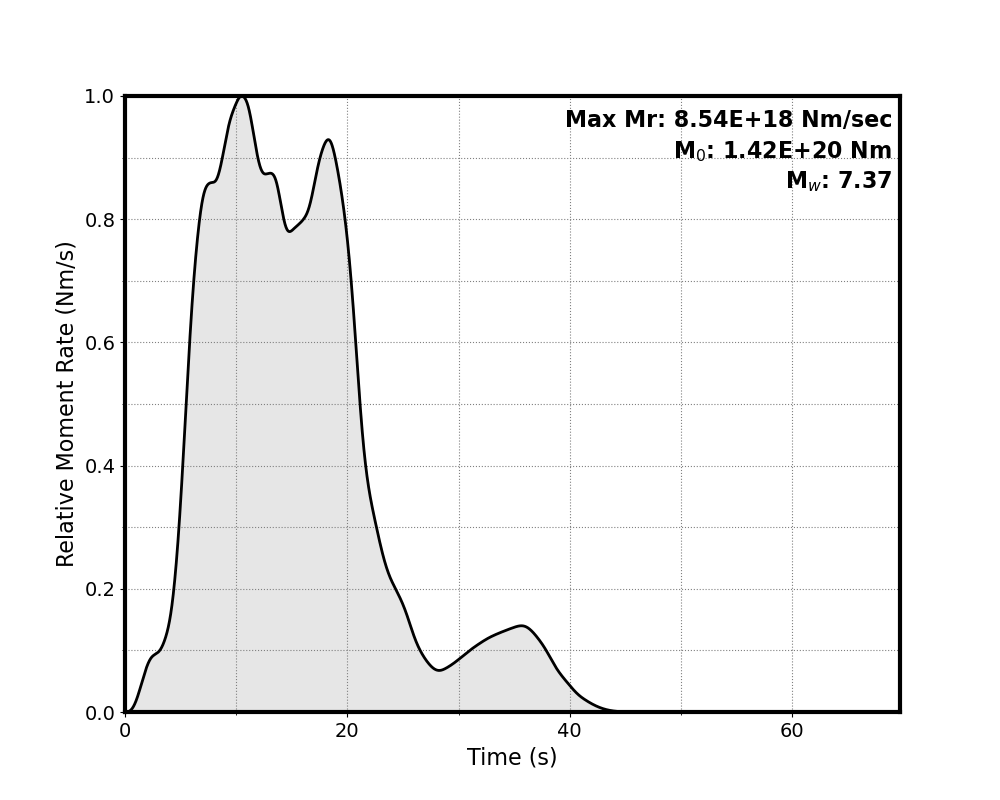

In [11]:
display(Image(os.path.join(E,'NP2_ref/plots/MomentRate.png')))

### B3. Waveform fits (steep plane, NP2_ref)
39 P + 23 SH channels. Depth phases (pP/sP arriving ~40–60 s after P at this depth) are well
modelled at all azimuths — they are the signal that carries the depth information.

In [12]:
display(Image(os.path.join(E,'NP2_ref/plots/P_body_waves.png')))

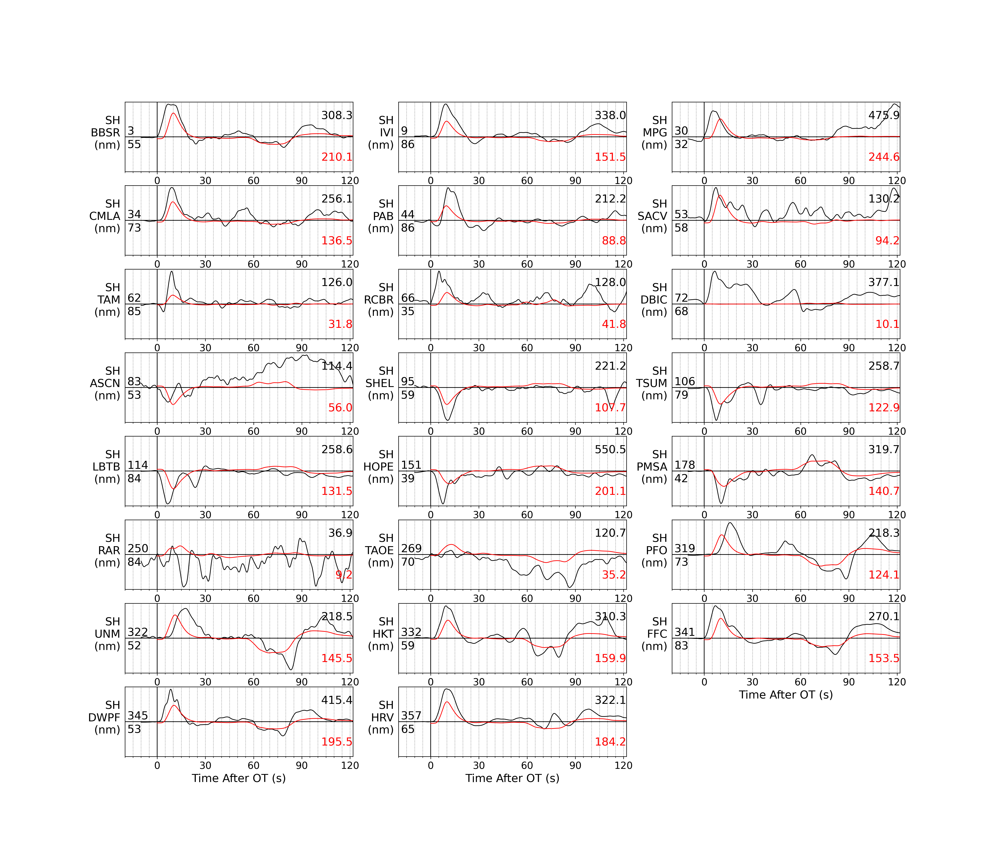

In [13]:
display(Image(os.path.join(E,'NP2_ref/plots/SH_body_waves.png')))

Shallow plane (NP1_ref) fits, for comparison — visually similar in most panels; the 10%
misfit difference accumulates in the depth-phase group at mid-azimuth stations.

In [14]:
display(Image(os.path.join(E,'NP1_ref/plots/P_body_waves.png')))

### B4. Source dimensions and stress drop
Same recipe as nb24 (μ = 67.5 GPa from WISP's shear model at source depth; Eshelby circular
crack on threshold-trimmed effective area; all thresholds disclosed).

In [15]:
import fig_fault_isochrone as fi
rows = []
for p, name in (('NP1_ref','shallow 172/21'), ('NP2_ref','steep 341/69')):
    d = os.path.join(E, p)
    s = fi.parse_solution(os.path.join(d, 'Solution.txt'))
    slip, Dx, Dy = s['slip'], s['Dx'], s['Dy']
    mu = float(open(os.path.join(d,'shear_model.txt')).read().split('\n')[2].split()[0])/10.
    cell = Dx*Dy*1e6
    for thr in (0.15, 0.20):
        m = slip >= thr*slip.max()
        A = m.sum()*cell; L = m.any(axis=0).sum()*Dx; W = m.any(axis=1).sum()*Dy
        M0e = mu*slip[m].sum()*cell; Rr = np.sqrt(A/np.pi)
        rows.append(dict(plane=name, thr=thr, L_km=L, W_km=W, A_km2=A/1e6,
                         Dbar_m=round(slip[m].mean(),2),
                         dSigma_MPa=round(7/16*M0e/Rr**3/1e6, 1)))
pd.DataFrame(rows)

,plane,thr,L_km,W_km,A_km2,Dbar_m,dSigma_MPa
0,shallow 172/21,0.15,115.50,88.53,4606.9650,0.40,1.0
1,shallow 172/21,0.20,90.75,88.53,3370.9500,0.48,1.4
2,steep 341/69,0.15,82.50,81.72,3202.4025,0.56,1.6
3,steep 341/69,0.20,74.25,81.72,2921.4900,0.59,1.8


Stress drop **~1–2 MPa** on either plane — at the gentle end of the cluster spectrum
(2026 Calama ~2 MPa; Tarapacá 2005 ~15 MPa; 1950 ~10 MPa), and L/W ≈ 1 (equant rupture),
the expected unconfined intraslab geometry. The plane choice barely moves Δσ.

## C. 2024 vs 2026 — the comparative story
Two intraslab normal-faulting earthquakes, same cluster, same pipeline, ~80 km and 22 months
apart:

| | 2026 Calama M6.9 | 2024 San Pedro de Atacama M7.4 |
|---|---|---|
| hypocentre depth | 109 km | 127 km |
| our MT (preferred plane) | 194/16/−83, Mw 6.90 | 176/20/−70, Mw 7.40 |
| Kagan vs USGS Mww | 8.4° | 6.3° |
| surface waves in FFI | yes (after GF-cap repair) | impossible (both planes > cap) |
| plane discrimination (teleseismic) | **NO** — 0.1402 vs 0.1424 (1.6%) | **YES** — 0.1224 vs 0.1099 (10.2%) |
| preferred plane | shallow (marginal; regional precedent cuts both ways) | **steep** — agrees with Jia, against USGS FFM |
| slip depth extent | 105–113 km (compact lens) | 81–170 km (down-dip elongated) |
| peak slip / duration | 0.69 m / ~15 s | 1.11 m / ~40 s |
| stress drop (Eshelby, 15% trim) | ~2 MPa | ~1.6 MPa |

**Why discriminability flips with size:** plane discrimination from teleseismic body waves
requires the rupture to be long enough that the two conjugate geometries predict measurably
different depth-phase move-out across the fault. The 2026 rupture (~10 km) is a point source
at 25–60 s periods; the 2024 rupture (~50 km down-dip) is not. This is the pipeline's clean
empirical demonstration of where the information threshold sits — and it independently
validates Jia's steep-plane verdict with a method that uses none of their near-field data.

## D. Honest limitations
1. **Teleseismic-only.** No strong motion, no GNSS, no aftershock relocations. Our steep-plane
   preference is one independent line of evidence that happens to agree with Jia's multi-data
   verdict; it is not a replacement for it.
2. **No surface waves.** Physically impossible here (source below the GF bank), so the FFI
   rests on 62 body channels. The MT, however, is surface-wave-anchored (26 stations) and the
   two agree.
3. **No supershear test.** WISP's parameterisation (rupture-velocity range around a reference)
   was left at auto defaults; we did not attempt to resolve Jia's episodic ~4.2 km/s episodes.
   The MRF complexity is consistent with, but does not demonstrate, supershear.
4. **Body-wave depth leverage.** With slip spanning ~90 km of depth, a single "centroid depth"
   is a weak summary; we quote slip-weighted centroids per plane (130/138 km).

## Summary
| result | value |
|---|---|
| MT (both protocols, first-try) | **Mw 7.40, 176/20/−70**, 6.3° from USGS Mww |
| MT conjugate vs Jia's plane | 7.8° |
| FFI fair comparison | 62 identical body channels, both planes, zero drops |
| shallow plane (USGS FFM choice) | misfit 0.1224, slip 109–144 km |
| **steep plane (Jia choice)** | **misfit 0.1099 (10.2% better), slip 81–170 km ≈ Jia's 120–180 km** |
| robustness | independent re-anneals reproduce both misfits to 4 decimals |
| moment / stress drop | 1.42e20 N·m (Mw 7.37) both planes; Δσ ~1–2 MPa |
| moment rate | multi-pulse, ~40 s, matches USGS/Jia complexity |

**Take-homes**
1. The deep-event MTUQ protocol (long-period body band scaled to source duration) transferred
   to a Mw 7.4 with zero re-tuning — both wave-type choices give the same mechanism.
2. For a rupture this large, teleseismic body waves ALONE discriminate the disputed nodal
   planes: **the steep plane wins by 10%**, independently confirming Jia et al. against the
   USGS operational finite-fault choice.
3. The steep-plane slip model reproduces Jia's 120–180 km slip depths without any near-field
   data — down-dip rupture into the slab, the thermal-runaway depth range.
4. Combined with nb24's 2026 near-tie, the pair brackets the size threshold at which
   teleseismic plane discrimination turns on: somewhere between ~10 km and ~50 km of rupture
   extent at these depths and periods.